## Bibliotecas Utilizadas

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import regex as re
from collections import Counter
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from operator import itemgetter

from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation

# Carregando os dados 

In [2]:
politicos = {}
lista_dir = os.listdir("./politicos/")
nome_politicos = []
for nome in lista_dir:
    politicos[nome[:-4]] = df_amoedo = pd.read_csv(
        f"./politicos/{nome}",
        delimiter=",",
        encoding='utf-8',
        usecols=[1,2,8]
    )
    nome_politicos.append(nome[:-4])

In [3]:
print(len(nome_politicos))
politicos['Doria'].head()

11


,created_at,text,id
0,2021-04-19T13:04:16Z,São ao todo 41 milhões e 400 mil doses da vaci...,1384130730851135495
1,2021-04-19T13:04:15Z,"Estive hoje, às 5h30 da manhã, no Aeroporto de...",1384130727348867079
2,2021-04-19T10:03:50Z,Insumos para mais 5 milhões de doses da Vacina...,1384085323588665344
3,2021-04-19T09:17:48Z,"Bom dia, pessoal. Estamos em Guarulhos receben...",1384073738887438337
4,2021-04-19T01:28:03Z,A operação Paz e Proteção impediu a realização...,1383955522076827650


## Unindo Doria(1), Bolsonaro(2) e Lula(3) em um dataframe

In [30]:
# stopwords e simbolos a retirar
stop_words = set(['de','a','o','que','e','é','do','da','em','um','para','com','não','uma','os','no','se','na','por','mais','as','dos','como','mas','ao','ele','das','à','seu','sua','ou','quando','muito','nos','já','eu','também','só','pelo','pela','até','isso','ela','entre','depois','sem','mesmo','aos','seus','quem','nas','me','esse','eles','você','essa','num','nem','suas','meu','às','minha','numa','pelos','elas','qual','nós','lhe','deles','essas','esses','pelas','este','dele','tu','te','vocês','vos','lhes','meus','minhas','teu','tua','teus','tuas','nosso','nossa','nossos','nossas','dela','delas','esta','estes','estas','aquele','aquela','aqueles','aquelas','isto','aquilo','estou','está','estamos','estão','estive','esteve','estivemos','estiveram','estava','estávamos','estavam','estivera','estivéramos','esteja','estejamos','estejam','estivesse','estivéssemos','estivessem','estiver','estivermos','estiverem','hei','há','havemos','hão','houve','houvemos','houveram','houvera','houvéramos','haja','hajamos','hajam','houvesse','houvéssemos','houvessem','houver','houvermos','houverem','houverei','houverá','houveremos','houverão','houveria','houveríamos','houveriam','sou','somos','são','era','éramos','eram','fui','foi','fomos','foram','fora','fôramos','seja','sejamos','sejam','fosse','fôssemos','fossem','for','formos','forem','serei','será','seremos','serão','seria','seríamos','seriam','tenho','tem','temos','tém','tinha','tínhamos','tinham','tive','teve','tivemos','tiveram','tivera','tivéramos','tenha','tenhamos','tenham','tivesse','tivéssemos','tivessem','tiver','tivermos','tiverem','terei','terá','teremos','terão','teria','teríamos','teriam'])

symbols = set(['-', 'r$', 'R$', '.'])

# Doria
# separando as palavras
palavras = "".join(politicos['Doria']['text']).lower().split()
# returando stopwords e depois os web links
palavras = [w for w in palavras if not w in (stop_words | symbols)]
palavras = [w for w in palavras if re.match(r'https://*', w) == None]

c = Counter(palavras)
# retirando palavras com frequencia menor do que 5 e adicionando número ao candidato
dados = {(1,x,y) for x,y in zip(c,c.values()) if y > 5}
print("Doria", len(dados))

# Bolsonaro
palavras = "".join(politicos['Bolsonaro']['text']).lower().split()
palavras = [w for w in palavras if not w in (stop_words | symbols)]
palavras = [w for w in palavras if re.match(r'https://*', w) == None]

c = Counter(palavras)
d = {(2,x,y) for x,y in zip(c,c.values()) if y > 5}
print("Bolsonaro", len(d))
# adicionando aos dados
for x in d:
    dados.add(x)

# Lula
palavras = "".join(politicos['Lula']['text']).lower().split()
palavras = [w for w in palavras if not w in (stop_words | symbols)]
palavras = [w for w in palavras if re.match(r'https://*', w) == None]

c = Counter(palavras)
d = {(3,x,y) for x,y in zip(c,c.values()) if y > 5}
print("Lula", len(d))
for x in d:
    dados.add(x)

print("Total", len(dados))

# montando o dataframe
df = pd.DataFrame(dados, columns=['candidato', 'texto', 'frequencia'])
df.sort_values('frequencia', ascending=False)

Doria 1559
Bolsonaro 1475
Lula 1633
Total 4667


,candidato,texto,frequencia
1854,3,lula,602
3269,1,sp,452
2492,1,governo,445
3989,1,vacinar,435
3472,1,vou,418
...,...,...,...
2654,3,"rua,",6
2652,1,ribeirão,6
4150,2,40%,6
3348,3,stuckert],6


## WordCloud de todos

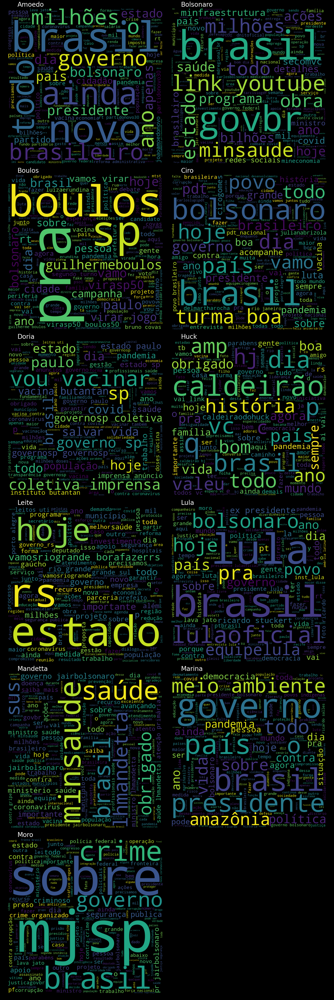

In [5]:
palavras = []
fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(20, 60), facecolor='k')
xc = 0
yc = 0
for idx in range(11):
    palavras.append("".join(politicos[nome_politicos[idx]]['text']).lower().split())
    palavras[idx] = [w for w in palavras[idx] if not w in (stop_words | symbols)]
    palavras[idx] = [w for w in palavras[idx] if re.match(r'https://*', w) == None]
    sumario = " ".join(s for s in palavras[idx])
    wordcloud = WordCloud(width=800, height=800).generate(sumario)
    ax[xc][yc].imshow(wordcloud)
    ax[xc][yc].text(50, -10, nome_politicos[idx], fontsize=28, color='white')
    yc += 1
    if (yc == 2):
        yc = 0
        xc += 1
        if (xc == 6):
            xc = 0

plt.axis('off')
plt.tight_layout(pad=0) 
plt.show()

Criando conjunto de palavras únicas com as palavras de todos os políticos

In [9]:
palavras_unicas = set()
numero_total_palavras = 0
for c in palavras:
    for p in c:
        set_palavras.add(p)
        numero_total_palavras += 1
print(numero_total_palavras, len(palavras_unicas))

509008 85147


## LDA - Latent Dirichlet Allocation - Modelagem de Tópicos

In [ ]:
# Function to remove emoji.
def emoji(string):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)

In [ ]:
def print_top_words(model, feature_names, n_top_words):
    for index, topic in enumerate(model.components_):
        message = "\nTopic #{}:".format(index)
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1 :-1]])
        print(message)
        print("="*70)

In [ ]:
# stopwords e simbolos a retirar
stop_words = set(stopwords.words('portuguese'))
symbols = set(['-', 'r$', 'R$'])

for idx in range(len(nome_politicos)):
    politicos[nome_politicos[idx]]['tweet_token'] = 'NaN'
    tweets = politicos[nome_politicos[idx]]['text']
    for index, row in politicos[nome_politicos[idx]].iterrows():
        tweet = row['text'].lower()
        tweet_token = [w for w in tweet.split() if not w in (stop_words | symbols)]
        tweet_token = [w for w in tweet_token if re.match(r'http*', w) == None]
        tweet_token = [w for w in tweet_token if not w.startswith('@')]
        tweet_token = [w for w in tweet_token if not w.startswith('#')]
        tweet_token = [w for w in tweet_token if w != 'rt']

        politicos[nome_politicos[idx]].loc[index, 'tweet_token'] = emoji(" ".join(tweet_token))

In [ ]:
tweets = list()
for politico in nome_politicos:
    tweets.extend(list(politicos[politico]['tweet_token']))

tf_vectorizer = CountVectorizer()
tf = tf_vectorizer.fit_transform(tweets)

lda = LatentDirichletAllocation(n_components=11, max_iter=5,
                                learning_method = 'online',
                                learning_offset = 50.,
                                random_state = 0)
lda.fit(tf)

n_top_words = 3
print("\nTópico no Modelo LDA: ")
print("*"*70)
tf_feature_names = tf_vectorizer.get_feature_names()
print_top_words(lda, tf_feature_names, n_top_words)

## LDA - Latent Dirichlet Allocation - Modelagem de Tópicos Politicos

In [ ]:
tf_vectorizer = CountVectorizer()
for politico in nome_politicos:
    tf = tf_vectorizer.fit_transform((list(politicos[politico]['tweet_token'])))
    lda = LatentDirichletAllocation(n_components=11, max_iter=5,
                                    learning_method = 'online',
                                    learning_offset = 50.,
                                    random_state = 0)
    lda.fit(tf)

    n_top_words = 3
    print(f"\nTópico no Modelo LDA: {politico}")
    print("*"*70)
    tf_feature_names = tf_vectorizer.get_feature_names()
    print_top_words(lda, tf_feature_names, n_top_words)